# Синтез изображений.

## Переключение версии TensorFlow

In [1]:
import numpy as np
import matplotlib.pyplot as plt

import tensorflow as tf
import tensorflow_datasets as tfds

## Загрузка и подготовка датасета LFW

In [2]:
tfds.disable_progress_bar()

train_ds, ds_info = tfds.load(
    'lfw',
    data_dir='G:\data',
    as_supervised=True,
    with_info=True,
    split='train',
)

## Визуализация датасета LFW

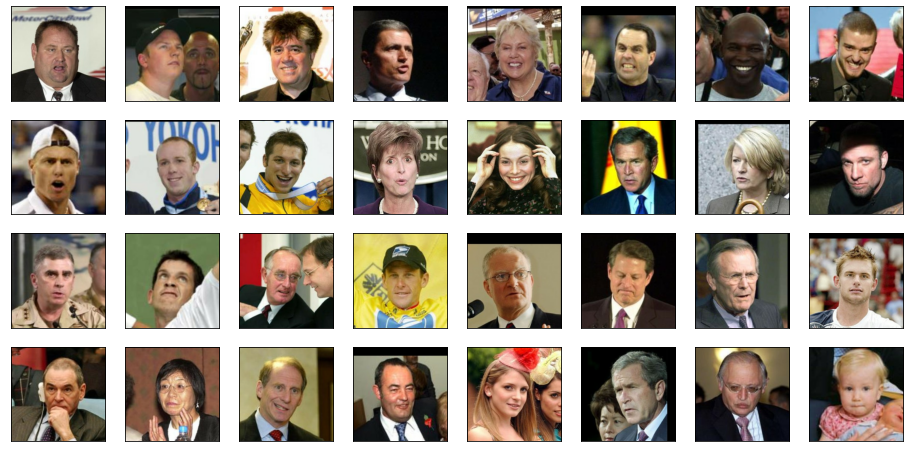

In [3]:
some_samples = [x for x in iter(train_ds.take(32))]
fig = plt.figure(figsize=(16, 8))
for j in range(len(some_samples)):
    ax = fig.add_subplot(4, 8, j+1)
    ax.imshow(some_samples[j][1])
    plt.xticks([]), plt.yticks([])
plt.show()

In [4]:
INPUT_DIM = 100
NUM_EPOCHS = 40
HALF_BATCH_SIZE = 16
BATCH_SIZE = HALF_BATCH_SIZE * 2
LEARNING_RATE = 0.0002

def resize(label, img):
  img = tf.image.resize(img, [224, 224])
  return label, (tf.cast(img, tf.float32)- 127.5) / 127.5

train_ds = train_ds.repeat(NUM_EPOCHS)
train_ds = train_ds.batch(HALF_BATCH_SIZE, drop_remainder=True)
train_ds = train_ds.map(resize)

## Deep Convolutional GAN (DCGAN)

In [5]:
generator = tf.keras.Sequential([
    tf.keras.layers.Dense(256*7*7, activation='relu'),
    tf.keras.layers.Reshape((7, 7, 256)),
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(256, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(128, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),  
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(64, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),  
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(32, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(), 
    tf.keras.layers.UpSampling2D((2, 2)),    
    tf.keras.layers.Conv2D(16, (3, 3), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.ReLU(),    
    tf.keras.layers.Conv2D(3, (3, 3), padding='same', activation='tanh'),
])

discriminator = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3, 3), strides=(2, 2), padding='same'),
    tf.keras.layers.LeakyReLU(0.2),
    tf.keras.layers.Dropout(0.25),    
    tf.keras.layers.Conv2D(64, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.ZeroPadding2D(padding=((0, 1), (0, 1))),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(128, kernel_size=3, strides=(2, 2), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(256, kernel_size=3, strides=(1, 1), padding='same'),
    tf.keras.layers.BatchNormalization(momentum=0.8),
    tf.keras.layers.LeakyReLU(alpha=0.2),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(1),
])

In [6]:
optimizer = tf.keras.optimizers.Adam(LEARNING_RATE)
sigmoid_cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [7]:
def plot_images(samples):
    fig = plt.figure(figsize=(10, 10))
    num = samples.shape[0]
    for j in range(num):
        ax = fig.add_subplot(8, 8, j+1)
        new_img = (samples[j, ...] * 127.5) + 127.5
        new_img = (tf.cast(new_img, tf.int16))
        ax.imshow(new_img)
        plt.xticks([]), plt.yticks([])
    plt.show()
    

[Step  0] D Loss: 0.7256; G Loss: 0.6067


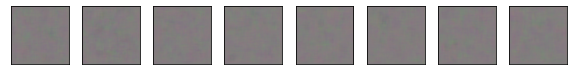

[Step 200] D Loss: 4.0643; G Loss: 6.5027


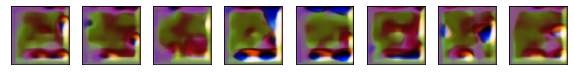

[Step 400] D Loss: 0.5696; G Loss: 62.3827


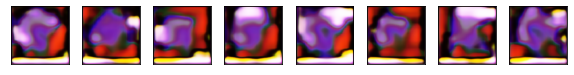

[Step 600] D Loss: 2.2915; G Loss: 32.2885


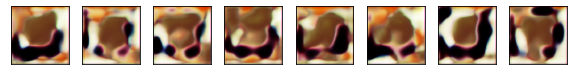

[Step 800] D Loss: 4.8674; G Loss: 4.2269


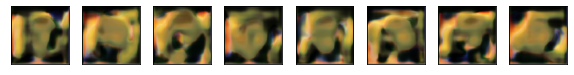

[Step 1000] D Loss: 1.2648; G Loss: 22.4177


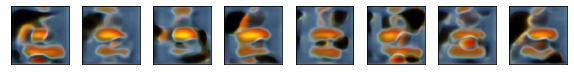

[Step 1200] D Loss: 1.3844; G Loss: 17.4076


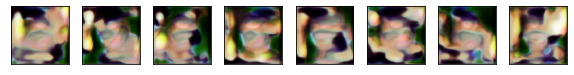

[Step 1400] D Loss: 4.4891; G Loss: 32.3644


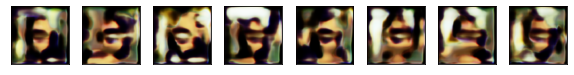

[Step 1600] D Loss: 6.1086; G Loss: 11.3370


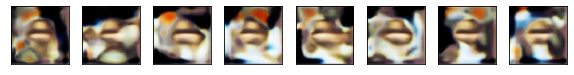

[Step 1800] D Loss: 0.8198; G Loss: 46.4356


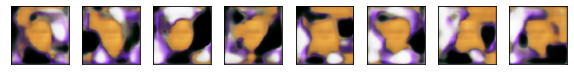

[Step 2000] D Loss: 4.9624; G Loss: 21.0643


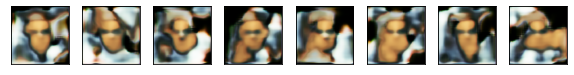

[Step 2200] D Loss: 1.0041; G Loss: 10.2630


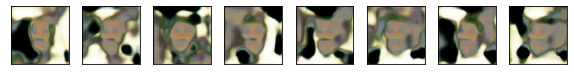

[Step 2400] D Loss: 1.0605; G Loss: 38.6062


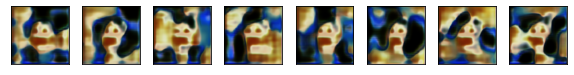

[Step 2600] D Loss: 0.1389; G Loss: 21.8258


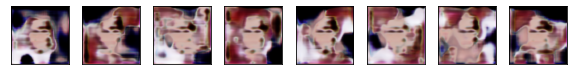

[Step 2800] D Loss: 0.5056; G Loss: 6.4512


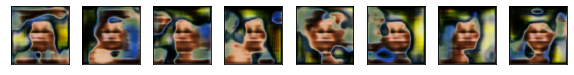

[Step 3000] D Loss: 0.1222; G Loss: 17.9427


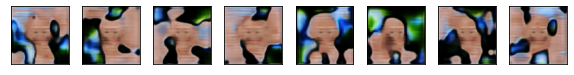

[Step 3200] D Loss: 1.9005; G Loss: 1.7304


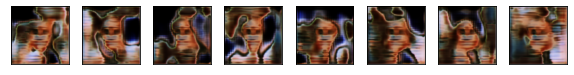

[Step 3400] D Loss: 2.0950; G Loss: 2.1281


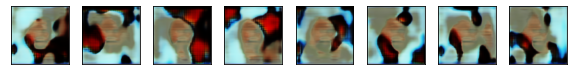

[Step 3600] D Loss: 0.4885; G Loss: 25.8171


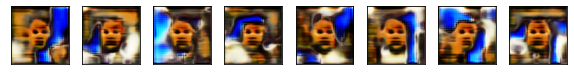

[Step 3800] D Loss: 3.4490; G Loss: 32.2578


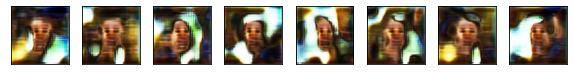

[Step 4000] D Loss: 1.6636; G Loss: 13.4592


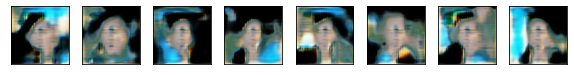

[Step 4200] D Loss: 2.2577; G Loss: 8.1846


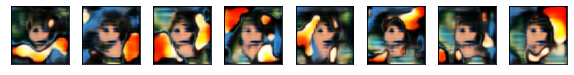

[Step 4400] D Loss: 2.3241; G Loss: 0.7369


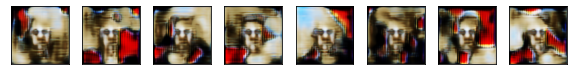

[Step 4600] D Loss: 2.6644; G Loss: 14.3543


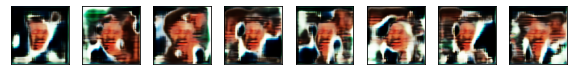

[Step 4800] D Loss: 0.8757; G Loss: 3.6077


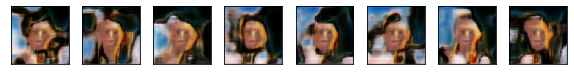

[Step 5000] D Loss: 0.1687; G Loss: 15.4877


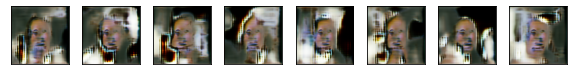

[Step 5200] D Loss: 0.7246; G Loss: 17.5205


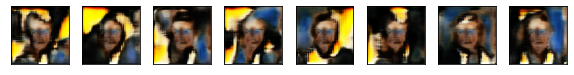

[Step 5400] D Loss: 1.4916; G Loss: 4.5896


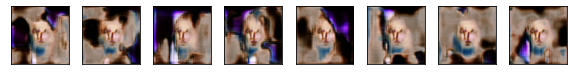

[Step 5600] D Loss: 2.1011; G Loss: 22.4095


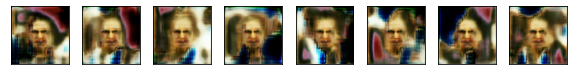

[Step 5800] D Loss: 0.9337; G Loss: 21.9866


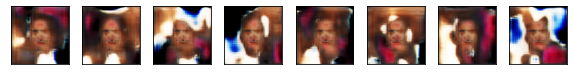

[Step 6000] D Loss: 0.4140; G Loss: 18.5919


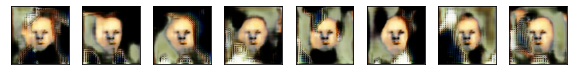

[Step 6200] D Loss: 0.8652; G Loss: 11.8091


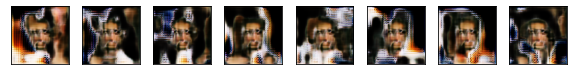

[Step 6400] D Loss: 1.6416; G Loss: 3.6264


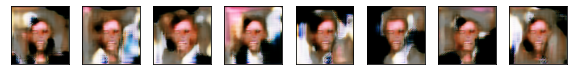

[Step 6600] D Loss: 0.0417; G Loss: 3.6307


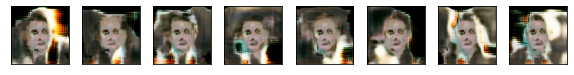

[Step 6800] D Loss: 0.0063; G Loss: 23.8869


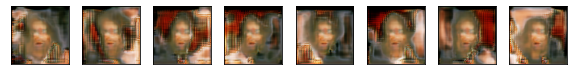

[Step 7000] D Loss: 0.0000; G Loss: 11.9540


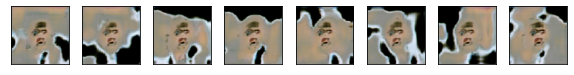

[Step 7200] D Loss: 0.0790; G Loss: 25.9255


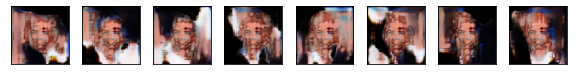

[Step 7400] D Loss: 0.2594; G Loss: 27.8869


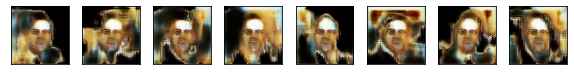

[Step 7600] D Loss: 1.3812; G Loss: 26.3328


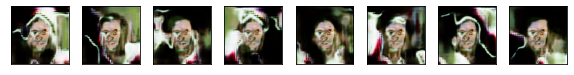

[Step 7800] D Loss: 1.3364; G Loss: 23.7406


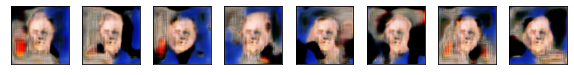

[Step 8000] D Loss: 1.5402; G Loss: 20.0534


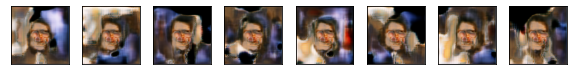

[Step 8200] D Loss: 0.8397; G Loss: 14.4184


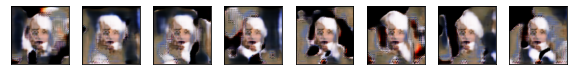

[Step 8400] D Loss: 0.4119; G Loss: 12.2187


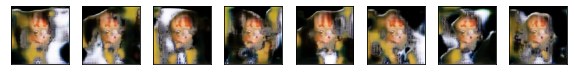

[Step 8600] D Loss: 1.2941; G Loss: 16.7089


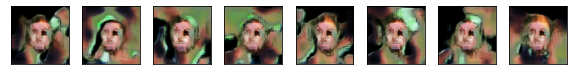

[Step 8800] D Loss: 2.1167; G Loss: 6.4474


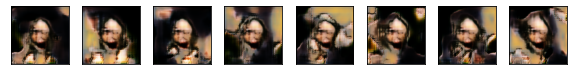

[Step 9000] D Loss: 0.5404; G Loss: 11.1205


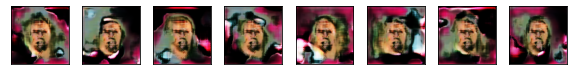

[Step 9200] D Loss: 0.0387; G Loss: 4.7211


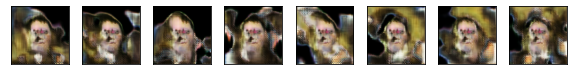

[Step 9400] D Loss: 0.1057; G Loss: 15.0784


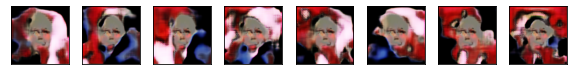

[Step 9600] D Loss: 1.3033; G Loss: 6.6690


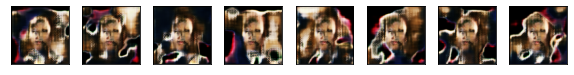

[Step 9800] D Loss: 0.6542; G Loss: 11.3524


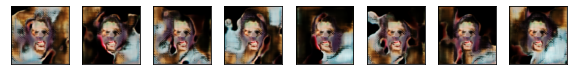

[Step 10000] D Loss: 1.6616; G Loss: 21.1000


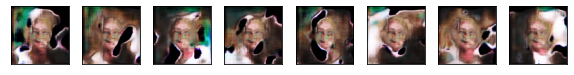

[Step 10200] D Loss: 0.0081; G Loss: 4.6512


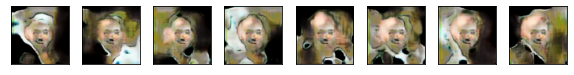

[Step 10400] D Loss: 0.3291; G Loss: 7.9547


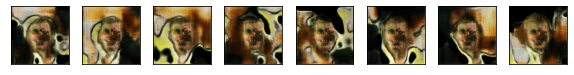

[Step 10600] D Loss: 0.5575; G Loss: 6.4571


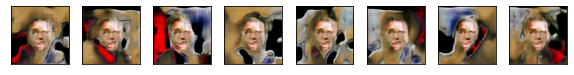

[Step 10800] D Loss: 0.2803; G Loss: 1.3846


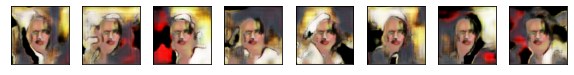

[Step 11000] D Loss: 0.2861; G Loss: 5.6121


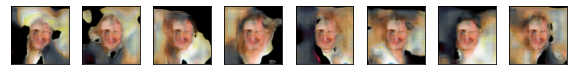

[Step 11200] D Loss: 0.1531; G Loss: 5.9586


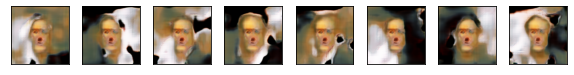

[Step 11400] D Loss: 1.1927; G Loss: 15.0710


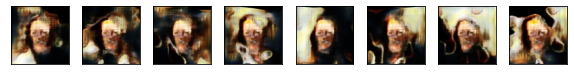

[Step 11600] D Loss: 0.4393; G Loss: 15.0012


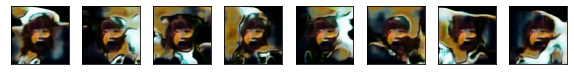

[Step 11800] D Loss: 0.6585; G Loss: 8.0720


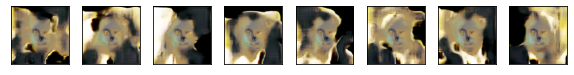

[Step 12000] D Loss: 1.6730; G Loss: 8.0466


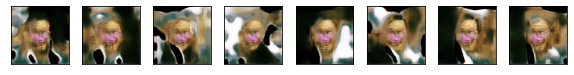

[Step 12200] D Loss: 0.3738; G Loss: 8.9617


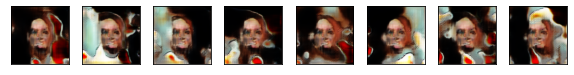

[Step 12400] D Loss: 0.3011; G Loss: 7.2802


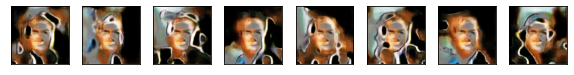

[Step 12600] D Loss: 0.1571; G Loss: 1.0854


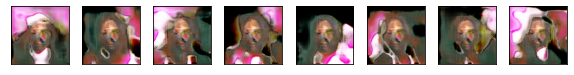

[Step 12800] D Loss: 0.6498; G Loss: 4.6222


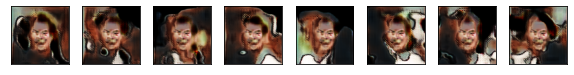

[Step 13000] D Loss: 0.1105; G Loss: 3.7124


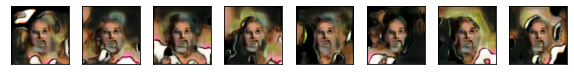

[Step 13200] D Loss: 0.1827; G Loss: 5.3395


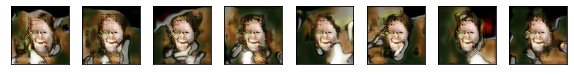

[Step 13400] D Loss: 0.1818; G Loss: 9.6289


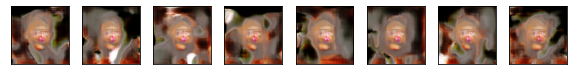

[Step 13600] D Loss: 0.2944; G Loss: 8.6886


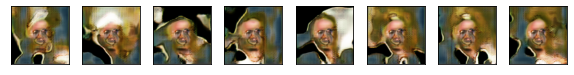

[Step 13800] D Loss: 0.1207; G Loss: 6.4382


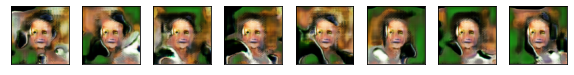

[Step 14000] D Loss: 0.4810; G Loss: 1.4061


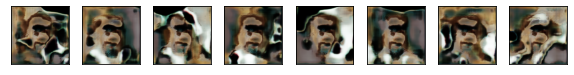

[Step 14200] D Loss: 0.0310; G Loss: 7.8224


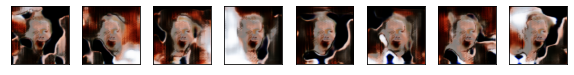

[Step 14400] D Loss: 0.1796; G Loss: 12.9657


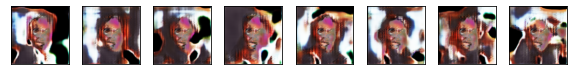

[Step 14600] D Loss: 0.8247; G Loss: 6.1131


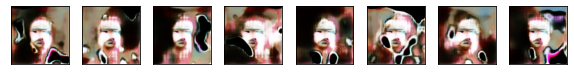

[Step 14800] D Loss: 0.0843; G Loss: 5.6732


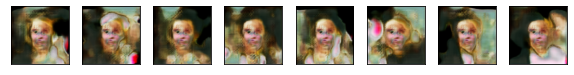

[Step 15000] D Loss: 0.5039; G Loss: 16.3557


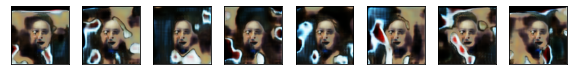

[Step 15200] D Loss: 1.3983; G Loss: 8.5981


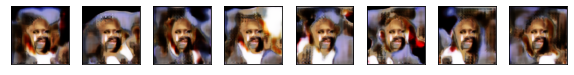

[Step 15400] D Loss: 0.4633; G Loss: 2.2260


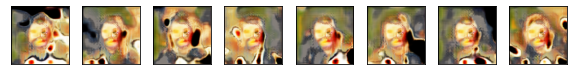

[Step 15600] D Loss: 0.4963; G Loss: 2.6998


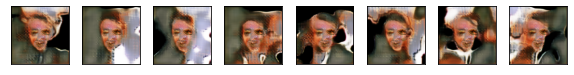

[Step 15800] D Loss: 0.0655; G Loss: 6.4540


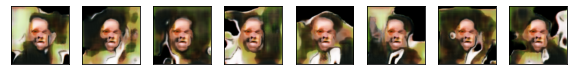

[Step 16000] D Loss: 0.4747; G Loss: 4.6597


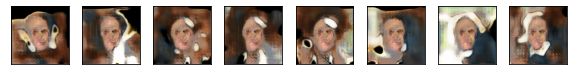

[Step 16200] D Loss: 0.1381; G Loss: 3.3903


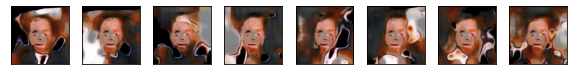

[Step 16400] D Loss: 0.9318; G Loss: 0.7564


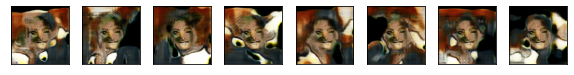

[Step 16600] D Loss: 0.1129; G Loss: 4.5609


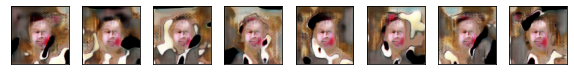

[Step 16800] D Loss: 0.2735; G Loss: 2.9083


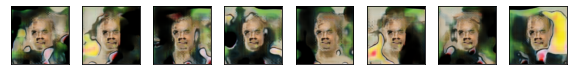

[Step 17000] D Loss: 0.6856; G Loss: 0.9321


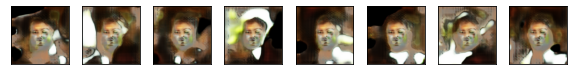

[Step 17200] D Loss: 0.1736; G Loss: 6.0337


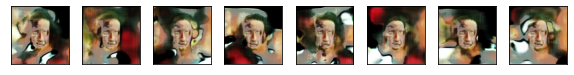

[Step 17400] D Loss: 0.6247; G Loss: 4.3072


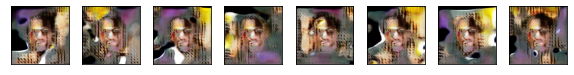

[Step 17600] D Loss: 0.2017; G Loss: 5.7684


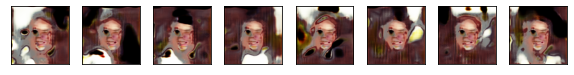

[Step 17800] D Loss: 0.2392; G Loss: 7.9221


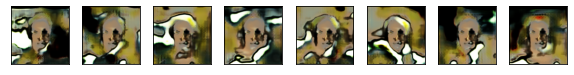

[Step 18000] D Loss: 0.3044; G Loss: 5.1137


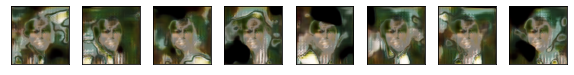

[Step 18200] D Loss: 1.2703; G Loss: 9.0558


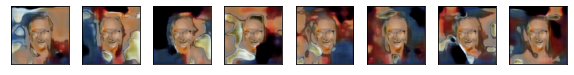

[Step 18400] D Loss: 0.1301; G Loss: 3.6981


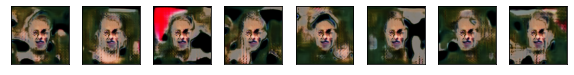

[Step 18600] D Loss: 2.4452; G Loss: 14.2416


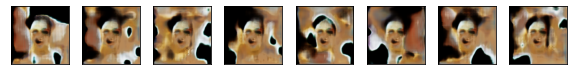

[Step 18800] D Loss: 0.2864; G Loss: 10.0804


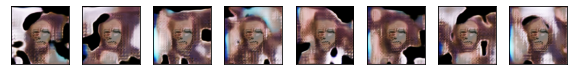

[Step 19000] D Loss: 0.2461; G Loss: 5.1697


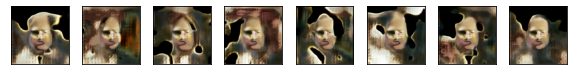

[Step 19200] D Loss: 0.6436; G Loss: 6.1336


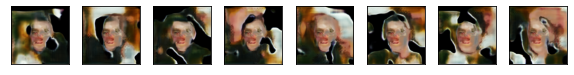

[Step 19400] D Loss: 0.9384; G Loss: 9.9027


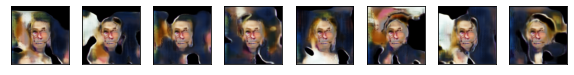

[Step 19600] D Loss: 0.3010; G Loss: 5.1976


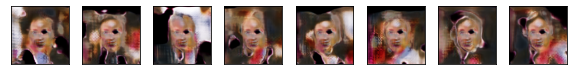

[Step 19800] D Loss: 0.1107; G Loss: 4.4008


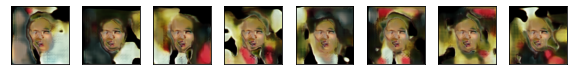

[Step 20000] D Loss: 0.3396; G Loss: 5.0803


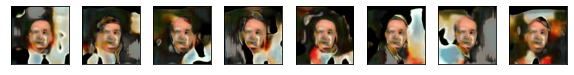

[Step 20200] D Loss: 0.1515; G Loss: 5.1202


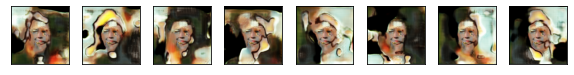

[Step 20400] D Loss: 0.3677; G Loss: 7.2798


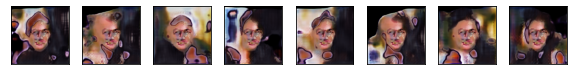

[Step 20600] D Loss: 0.1319; G Loss: 4.5464


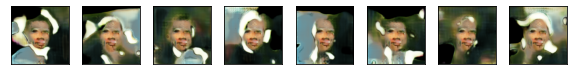

[Step 20800] D Loss: 0.2565; G Loss: 5.1884


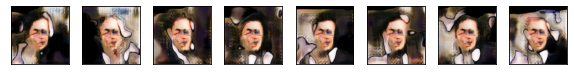

[Step 21000] D Loss: 1.1381; G Loss: 3.5649


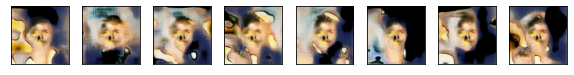

[Step 21200] D Loss: 0.2965; G Loss: 6.8299


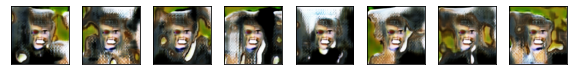

[Step 21400] D Loss: 0.4320; G Loss: 14.6217


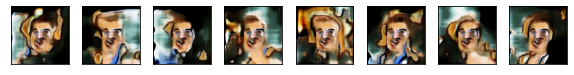

[Step 21600] D Loss: 0.4075; G Loss: 3.8386


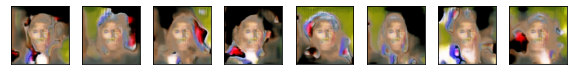

[Step 21800] D Loss: 0.0650; G Loss: 9.1462


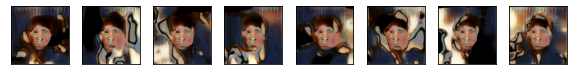

[Step 22000] D Loss: 0.1963; G Loss: 4.3111


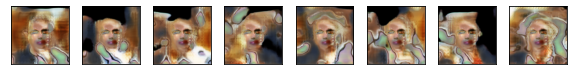

[Step 22200] D Loss: 0.3059; G Loss: 6.5780


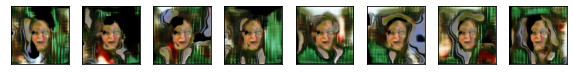

[Step 22400] D Loss: 0.7239; G Loss: 5.6405


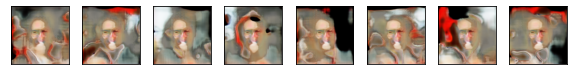

[Step 22600] D Loss: 0.3186; G Loss: 3.3453


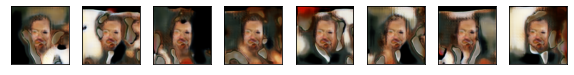

[Step 22800] D Loss: 0.0367; G Loss: 5.9130


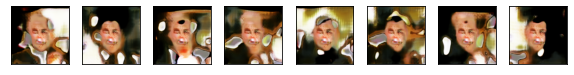

[Step 23000] D Loss: 0.4291; G Loss: 2.9909


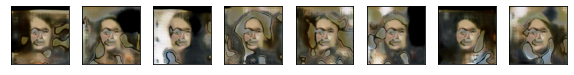

[Step 23200] D Loss: 0.6101; G Loss: 6.5314


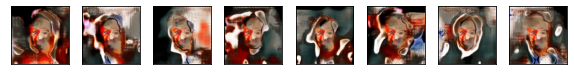

[Step 23400] D Loss: 1.2760; G Loss: 8.0742


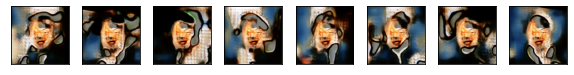

[Step 23600] D Loss: 0.1187; G Loss: 15.4712


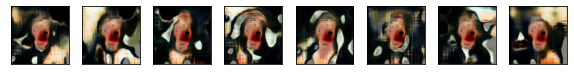

[Step 23800] D Loss: 0.3094; G Loss: 5.4526


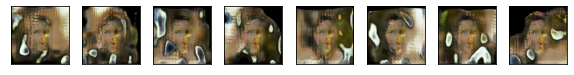

[Step 24000] D Loss: 0.7487; G Loss: 4.8552


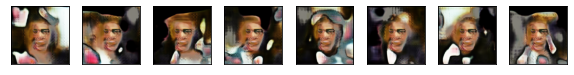

[Step 24200] D Loss: 0.3264; G Loss: 5.2568


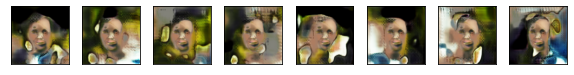

[Step 24400] D Loss: 0.2336; G Loss: 4.8643


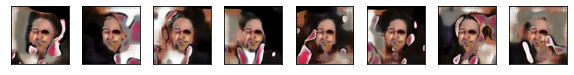

[Step 24600] D Loss: 0.2456; G Loss: 1.1165


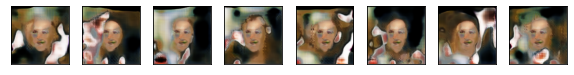

[Step 24800] D Loss: 0.8726; G Loss: 3.7090


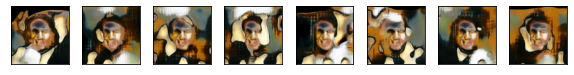

[Step 25000] D Loss: 0.1330; G Loss: 4.5928


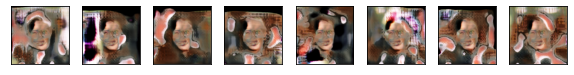

[Step 25200] D Loss: 0.1599; G Loss: 4.0810


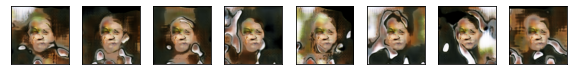

[Step 25400] D Loss: 0.2420; G Loss: 4.5618


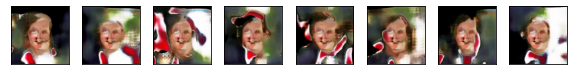

[Step 25600] D Loss: 0.4417; G Loss: 3.0937


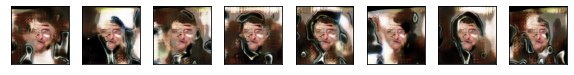

[Step 25800] D Loss: 0.4686; G Loss: 5.1234


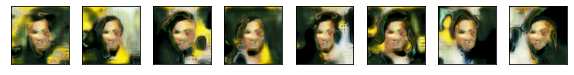

[Step 26000] D Loss: 0.2251; G Loss: 2.5919


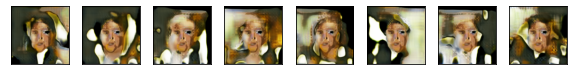

[Step 26200] D Loss: 0.5218; G Loss: 4.3970


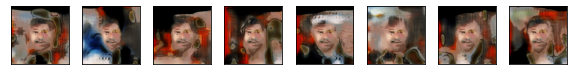

[Step 26400] D Loss: 0.3475; G Loss: 4.6479


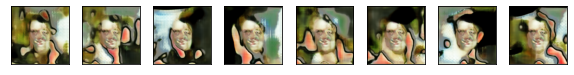

[Step 26600] D Loss: 0.3633; G Loss: 3.3620


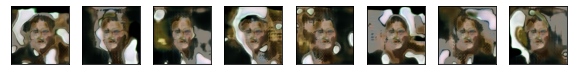

[Step 26800] D Loss: 0.6741; G Loss: 7.2825


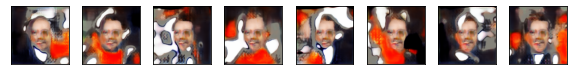

[Step 27000] D Loss: 0.3926; G Loss: 3.8361


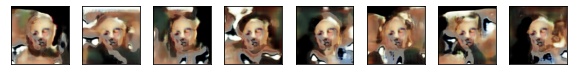

[Step 27200] D Loss: 0.5273; G Loss: 4.2616


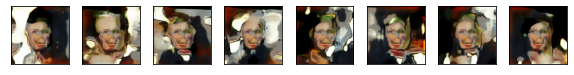

[Step 27400] D Loss: 0.2460; G Loss: 2.2118


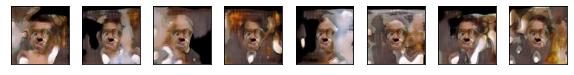

[Step 27600] D Loss: 0.0475; G Loss: 4.9866


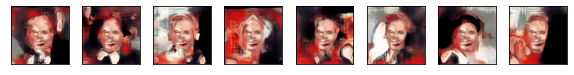

[Step 27800] D Loss: 0.2983; G Loss: 3.7765


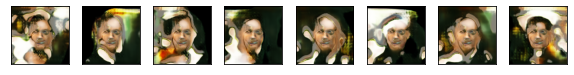

[Step 28000] D Loss: 0.2869; G Loss: 3.5359


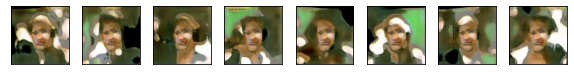

[Step 28200] D Loss: 0.2088; G Loss: 5.1323


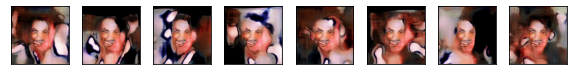

[Step 28400] D Loss: 0.3862; G Loss: 6.4670


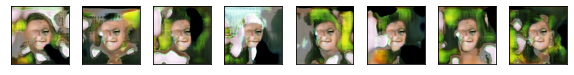

[Step 28600] D Loss: 0.2154; G Loss: 3.9402


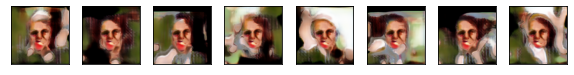

[Step 28800] D Loss: 0.3233; G Loss: 5.3437


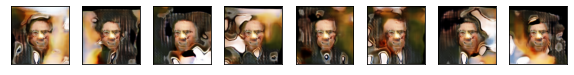

[Step 29000] D Loss: 0.7154; G Loss: 9.0186


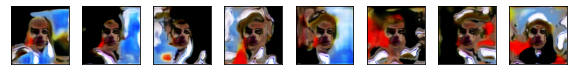

[Step 29200] D Loss: 0.0444; G Loss: 8.0660


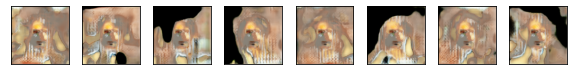

[Step 29400] D Loss: 0.7513; G Loss: 12.0260


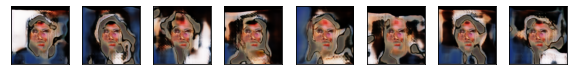

[Step 29600] D Loss: 0.1094; G Loss: 13.0511


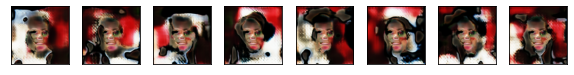

[Step 29800] D Loss: 0.2660; G Loss: 5.2852


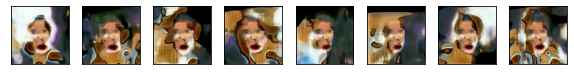

[Step 30000] D Loss: 0.2335; G Loss: 4.0585


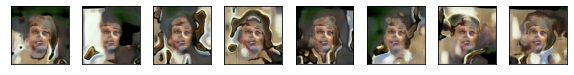

[Step 30200] D Loss: 0.2184; G Loss: 3.6774


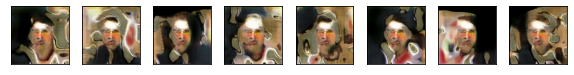

[Step 30400] D Loss: 0.2932; G Loss: 4.2268


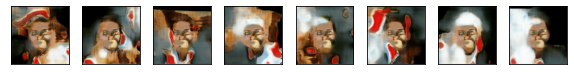

[Step 30600] D Loss: 0.3631; G Loss: 5.1866


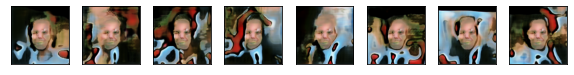

[Step 30800] D Loss: 0.3571; G Loss: 5.3701


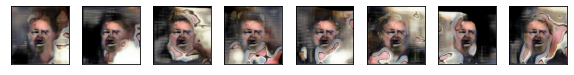

[Step 31000] D Loss: 0.3712; G Loss: 4.9929


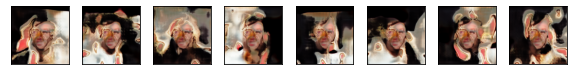

[Step 31200] D Loss: 0.2845; G Loss: 1.6615


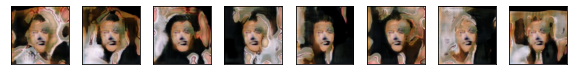

[Step 31400] D Loss: 0.5650; G Loss: 2.4206


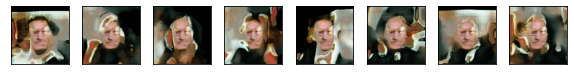

[Step 31600] D Loss: 0.8645; G Loss: 3.1814


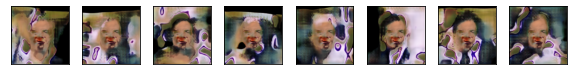

[Step 31800] D Loss: 0.0541; G Loss: 4.4369


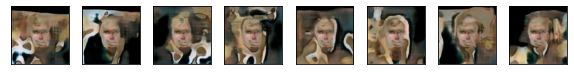

[Step 32000] D Loss: 0.5134; G Loss: 4.0537


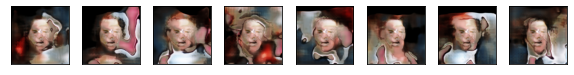

[Step 32200] D Loss: 0.5913; G Loss: 6.3442


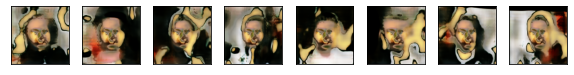

[Step 32400] D Loss: 0.1258; G Loss: 3.7591


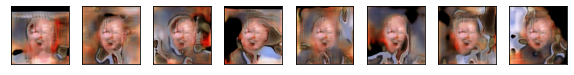

[Step 32600] D Loss: 0.4415; G Loss: 2.5850


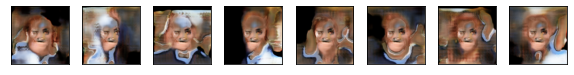

[Step 32800] D Loss: 0.4323; G Loss: 5.8498


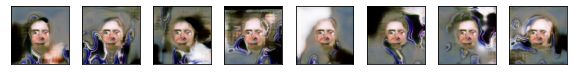

[Step 33000] D Loss: 0.6401; G Loss: 4.0065


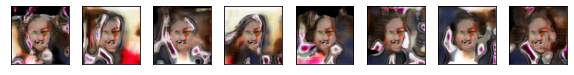

In [8]:
for step, (_, true_images) in enumerate(train_ds):
    
    # Train Discriminator
    
    noise = np.random.normal(0, 1, (HALF_BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    syntetic_images = generator.predict(noise)
    x_combined = np.concatenate((
        true_images, 
        syntetic_images))
    y_combined = np.concatenate((
        np.ones((HALF_BATCH_SIZE, 1), np.float32), 
        np.zeros((HALF_BATCH_SIZE, 1), np.float32)))
    
    with tf.GradientTape() as tape:
        logits = discriminator(x_combined, training=True)
        d_loss_value = sigmoid_cross_entropy(y_combined, logits)
    grads = tape.gradient(d_loss_value, discriminator.trainable_variables)
    optimizer.apply_gradients(zip(grads, discriminator.trainable_variables))
    
    # Train Generator
    
    noise = np.random.normal(0, 1, (BATCH_SIZE, INPUT_DIM)).astype(np.float32)
    y_mislabled = np.ones((BATCH_SIZE, 1), np.float32)
    
    with tf.GradientTape() as tape:
        syntetic = generator(noise, training=True)
        logits = discriminator(syntetic, training=False)
        g_loss_value = sigmoid_cross_entropy(y_mislabled, logits)
    grads = tape.gradient(g_loss_value, generator.trainable_variables)
    optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    
    # Check intermediate results
    
    if step % 200 == 0:
        print('[Step %2d] D Loss: %.4f; G Loss: %.4f' % (
            step, d_loss_value.numpy(), g_loss_value.numpy()))
        noise = np.random.normal(0, 1, (8, INPUT_DIM)).astype(np.float32)
        syntetic_images = generator.predict(noise)
        plot_images(syntetic_images)


## Тестирование свёрточного генератора

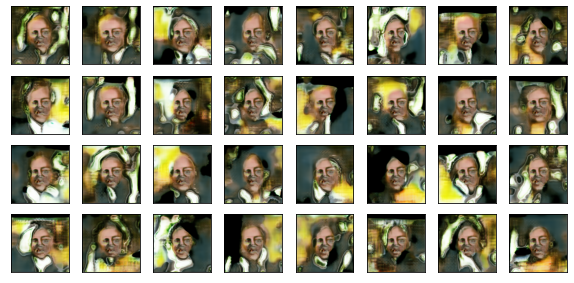

In [9]:
noise = np.random.normal(0, 1, (32, INPUT_DIM)).astype(np.float32)
syntetic_images = generator.predict(noise)
plot_images(syntetic_images)

## Интерполяция в латентном пространстве

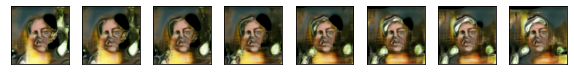

In [10]:
noise_1 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise_2 = np.random.normal(0, 1, (INPUT_DIM)).astype(np.float32)
noise = np.linspace(noise_1, noise_2, 8)
syntetic_images = generator.predict(noise)
plot_images(syntetic_images)

Для хорошего результата необходимо 200-400 эпох